# Applying XID+SED to Extreme Starbursts
In this notebook, we read in the data files and prepare them for fitting with XID+SED, the SED prior model extension to XID+. Here we focus on the source `HELP_J104631.170+591036.829`. This source is in [Rowan-Robinson et al. 2018](https://arxiv.org/abs/1704.07783) and claimed to have a star formation rate of $> 10^{10}\mathrm{M_{\odot}yr^{-1}}$

Import required modules

In [1]:
from astropy.io import ascii, fits
from astropy.table import Table
import pylab as plt
%matplotlib inline
from astropy import wcs


import numpy as np
import xidplus
from xidplus import moc_routines
import pickle

/Users/pdh21/anaconda3/envs/xidplus/lib/python3.6/site-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


Set image and catalogue filenames

In [2]:
#Folder containing maps

pswfits='/Volumes/pdh_storage/dmu_products/dmu19/dmu19_HELP-SPIRE-maps/data/Lockman-SWIRE_SPIRE250_v1.0.fits'#SPIRE 250 map
pmwfits='/Volumes/pdh_storage/dmu_products/dmu19/dmu19_HELP-SPIRE-maps/data/Lockman-SWIRE_SPIRE350_v1.0.fits'#SPIRE 350 map
plwfits='/Volumes/pdh_storage//dmu_products/dmu19/dmu19_HELP-SPIRE-maps/data/Lockman-SWIRE_SPIRE500_v1.0.fits'#SPIRE 500 map




#output folder
output_folder='./'

Load in images, noise maps, header info and WCS information

In [3]:
#-----250-------------
hdulist = fits.open(pswfits)
im250phdu=hdulist[0].header
im250hdu=hdulist[1].header

im250=hdulist[1].data*1.0E3 #convert to mJy
nim250=hdulist[3].data*1.0E3 #convert to mJy
w_250 = wcs.WCS(hdulist[1].header)
pixsize250=3600.0*w_250.wcs.cd[1,1] #pixel size (in arcseconds)
hdulist.close()
#-----350-------------
hdulist = fits.open(pmwfits)
im350phdu=hdulist[0].header
im350hdu=hdulist[1].header

im350=hdulist[1].data*1.0E3 #convert to mJy
nim350=hdulist[3].data*1.0E3 #convert to mJy
w_350 = wcs.WCS(hdulist[1].header)
pixsize350=3600.0*w_350.wcs.cd[1,1] #pixel size (in arcseconds)
hdulist.close()
#-----500-------------
hdulist = fits.open(plwfits)
im500phdu=hdulist[0].header
im500hdu=hdulist[1].header 
im500=hdulist[1].data*1.0E3 #convert to mJy
nim500=hdulist[3].data*1.0E3 #convert to mJy
w_500 = wcs.WCS(hdulist[1].header)
pixsize500=3600.0*w_500.wcs.cd[1,1] #pixel size (in arcseconds)
hdulist.close()

XID+ uses Multi Order Coverage (MOC) maps for cutting down maps and catalogues so they cover the same area. It can also take in MOCs as selection functions to carry out additional cuts. Lets use the python module [pymoc](http://pymoc.readthedocs.io/en/latest/) to create a MOC, centered on a specific position we are interested in. We will use a HEALPix order of 15 (the resolution: higher order means higher resolution)

Read in the source we are interested in from Rowan-Robinsons's catalogue.

In [4]:
ysb=Table.read('../../../data/MRRfiles/fromPaper.txt', format='ascii')

In [5]:
from astropy.coordinates import SkyCoord
from astropy import units as u
import os

c = SkyCoord(ra=[ysb['RA'][32]]*u.degree, dec=[ysb['dec'][32]]*u.degree)

import pymoc
moc=pymoc.util.catalog.catalog_to_moc(c,100,15)

Load in catalogue you want to fit (and make any cuts). Here we use HELP's VO database and directly call it using PyVO

In [6]:
import pyvo as vo
service = vo.dal.TAPService("https://herschel-vos.phys.sussex.ac.uk/__system__/tap/run/tap")

In [7]:
resultset = service.search("SELECT TOP 10000 * FROM herschelhelp.main WHERE 1=CONTAINS(POINT('ICRS', ra, dec),CIRCLE('ICRS',"+str(c.ra.deg[0])+", "+str(c.dec.deg[0])+", 0.028 ))")

In [8]:
masterlist=resultset.table

In [9]:
masterlist

field,help_id,ra,dec,hp_idx,ebv,redshift,zspec,zspec_qual,zspec_association_flag,stellarity,stellarity_origin,f_90prime_g,ferr_90prime_g,f_ap_90prime_g,ferr_ap_90prime_g,m_90prime_g,merr_90prime_g,m_ap_90prime_g,merr_ap_90prime_g,flag_90prime_g,f_90prime_r,ferr_90prime_r,f_ap_90prime_r,ferr_ap_90prime_r,m_90prime_r,merr_90prime_r,m_ap_90prime_r,merr_ap_90prime_r,flag_90prime_r,f_90prime_z,ferr_90prime_z,f_ap_90prime_z,ferr_ap_90prime_z,m_90prime_z,merr_90prime_z,m_ap_90prime_z,merr_ap_90prime_z,flag_90prime_z,f_acs_f435w,ferr_acs_f435w,f_ap_acs_f435w,ferr_ap_acs_f435w,m_acs_f435w,merr_acs_f435w,m_ap_acs_f435w,merr_ap_acs_f435w,flag_acs_f435w,f_acs_f606w,ferr_acs_f606w,f_ap_acs_f606w,ferr_ap_acs_f606w,m_acs_f606w,merr_acs_f606w,m_ap_acs_f606w,merr_ap_acs_f606w,flag_acs_f606w,f_acs_f775w,ferr_acs_f775w,f_ap_acs_f775w,ferr_ap_acs_f775w,m_acs_f775w,merr_acs_f775w,m_ap_acs_f775w,merr_ap_acs_f775w,flag_acs_f775w,f_acs_f814w,ferr_acs_f814w,f_ap_acs_f814w,ferr_ap_acs_f814w,m_acs_f814w,merr_acs_f814w,m_ap_acs_f814w,merr_ap_acs_f814w,flag_acs_f814w,f_acs_f850lp,ferr_acs_f850lp,f_ap_acs_f850lp,ferr_ap_acs_f850lp,m_acs_f850lp,merr_acs_f850lp,m_ap_acs_f850lp,merr_ap_acs_f850lp,flag_acs_f850lp,f_bessell_b,ferr_bessell_b,f_ap_bessell_b,ferr_ap_bessell_b,m_bessell_b,merr_bessell_b,m_ap_bessell_b,merr_ap_bessell_b,flag_bessell_b,f_bessell_i,ferr_bessell_i,f_ap_bessell_i,ferr_ap_bessell_i,m_bessell_i,merr_bessell_i,m_ap_bessell_i,merr_ap_bessell_i,flag_bessell_i,f_bessell_r,ferr_bessell_r,f_ap_bessell_r,ferr_ap_bessell_r,m_bessell_r,merr_bessell_r,m_ap_bessell_r,merr_ap_bessell_r,flag_bessell_r,f_bessell_u,ferr_bessell_u,f_ap_bessell_u,ferr_ap_bessell_u,m_bessell_u,merr_bessell_u,m_ap_bessell_u,merr_ap_bessell_u,flag_bessell_u,f_bessell_v,ferr_bessell_v,f_ap_bessell_v,ferr_ap_bessell_v,m_bessell_v,merr_bessell_v,m_ap_bessell_v,merr_ap_bessell_v,flag_bessell_v,f_cfht12k_b,ferr_cfht12k_b,f_ap_cfht12k_b,ferr_ap_cfht12k_b,m_cfht12k_b,merr_cfht12k_b,m_ap_cfht12k_b,merr_ap_cfht12k_b,flag_cfht12k_b,f_cfht12k_i,ferr_cfht12k_i,f_ap_cfht12k_i,ferr_ap_cfht12k_i,m_cfht12k_i,merr_cfht12k_i,m_ap_cfht12k_i,merr_ap_cfht12k_i,flag_cfht12k_i,f_cfht12k_r,ferr_cfht12k_r,f_ap_cfht12k_r,ferr_ap_cfht12k_r,m_cfht12k_r,merr_cfht12k_r,m_ap_cfht12k_r,merr_ap_cfht12k_r,flag_cfht12k_r,f_decam_g,ferr_decam_g,f_ap_decam_g,ferr_ap_decam_g,m_decam_g,merr_decam_g,m_ap_decam_g,merr_ap_decam_g,flag_decam_g,f_decam_i,ferr_decam_i,f_ap_decam_i,ferr_ap_decam_i,m_decam_i,merr_decam_i,m_ap_decam_i,merr_ap_decam_i,flag_decam_i,f_decam_r,ferr_decam_r,f_ap_decam_r,ferr_ap_decam_r,m_decam_r,merr_decam_r,m_ap_decam_r,merr_ap_decam_r,flag_decam_r,f_decam_y,ferr_decam_y,f_ap_decam_y,ferr_ap_decam_y,m_decam_y,merr_decam_y,m_ap_decam_y,merr_ap_decam_y,flag_decam_y,f_decam_z,ferr_decam_z,f_ap_decam_z,ferr_ap_decam_z,m_decam_z,merr_decam_z,m_ap_decam_z,merr_ap_decam_z,flag_decam_z,f_galex_fuv,ferr_galex_fuv,f_ap_galex_fuv,ferr_ap_galex_fuv,m_galex_fuv,merr_galex_fuv,m_ap_galex_fuv,merr_ap_galex_fuv,flag_galex_fuv,f_galex_nuv,ferr_galex_nuv,f_ap_galex_nuv,ferr_ap_galex_nuv,m_galex_nuv,merr_galex_nuv,m_ap_galex_nuv,merr_ap_galex_nuv,flag_galex_nuv,f_gpc1_g,ferr_gpc1_g,f_ap_gpc1_g,ferr_ap_gpc1_g,m_gpc1_g,merr_gpc1_g,m_ap_gpc1_g,merr_ap_gpc1_g,flag_gpc1_g,f_gpc1_i,ferr_gpc1_i,f_ap_gpc1_i,ferr_ap_gpc1_i,m_gpc1_i,merr_gpc1_i,m_ap_gpc1_i,merr_ap_gpc1_i,flag_gpc1_i,f_gpc1_r,ferr_gpc1_r,f_ap_gpc1_r,ferr_ap_gpc1_r,m_gpc1_r,merr_gpc1_r,m_ap_gpc1_r,merr_ap_gpc1_r,flag_gpc1_r,f_gpc1_y,ferr_gpc1_y,f_ap_gpc1_y,ferr_ap_gpc1_y,m_gpc1_y,merr_gpc1_y,m_ap_gpc1_y,merr_ap_gpc1_y,flag_gpc1_y,f_gpc1_z,ferr_gpc1_z,f_ap_gpc1_z,ferr_ap_gpc1_z,m_gpc1_z,merr_gpc1_z,m_ap_gpc1_z,merr_ap_gpc1_z,flag_gpc1_z,f_hawki_k,ferr_hawki_k,f_ap_hawki_k,ferr_ap_hawki_k,m_hawki_k,merr_hawki_k,m_ap_hawki_k,merr_ap_hawki_k,flag_hawki_k,f_irac_i1,ferr_irac_i1,f_ap_irac_i1,ferr_ap_irac_i1,m_irac_i1,merr_irac_i1,m_ap_irac_i1,merr_ap_irac_i1,flag_irac_i1,f_irac_i2,ferr_irac_i2,f_ap_irac_i2,ferr_ap_irac_i2,m_irac_i2,merr_irac_i2,m_ap_irac_i2,merr

In [10]:
masterlist['help_id']

HELP_J104641.800+591134.329
HELP_J104642.298+591129.334
HELP_J104642.773+591122.819
HELP_J104643.184+591114.597
HELP_J104642.697+591110.431
HELP_J104643.626+591102.446
HELP_J104643.318+591100.617
HELP_J104643.761+591048.844
HELP_J104644.286+591042.028
HELP_J104632.384+591215.934
HELP_J104630.583+591211.071


## Filter table
We will only use objects that are not stars (i.e. have `flag_gaia` = 3)

In [11]:
prior_list=masterlist[(masterlist['flag_gaia']!=3)]# & (masterlist['flag_optnir_det']>=5)]

## Get Redshift and Uncertianty


Ken Duncan defines a median and a hierarchical bayes combination redshift. We need uncertianty so lets match via `help_id`

In [12]:
photoz=Table.read("/Volumes/pdh_storage/dmu_products/dmu24/dmu24_Lockman-SWIRE/data/master_catalogue_Lockman-SWIRE_20170710_photoz_20170802_r_and_irac1_optimised_UPDATED_IDs_20180219.fits")

In [13]:
help_id=np.empty((len(photoz)),dtype=np.dtype('U27'))
for i in range(0,len(photoz)):
    help_id[i]=photoz['help_id'][i].strip()
photoz['help_id']=help_id

In [14]:
from astropy.table import Column, MaskedColumn
prior_list['redshift']=MaskedColumn(np.full((len(prior_list)),fill_value=3.0),mask=[True]*len(prior_list))
prior_list.add_column(MaskedColumn(np.full((len(prior_list)),fill_value=3.0),mask=[True]*len(prior_list),name='redshift_unc'))

In [15]:
ii=0
for i in range(0,len(prior_list)):
    ind=photoz['help_id'] == prior_list['help_id'][i]
    try:
        prior_list['redshift'][i]=photoz['z1_median'][ind]
        prior_list['redshift_unc'][i]=np.max(np.array([np.abs(photoz['z1_median'][ind]-photoz['z1_min'][ind]),np.abs(photoz['z1_max'][ind]-photoz['z1_median'][ind])]))
        prior_list['redshift_unc'].mask[i]=False
        prior_list['redshift'].mask[i]=False

    except ValueError:
        None

In [16]:
prior_list[prior_list['redshift'].mask == False]

field,help_id,ra,dec,hp_idx,ebv,redshift,zspec,zspec_qual,zspec_association_flag,stellarity,stellarity_origin,f_90prime_g,ferr_90prime_g,f_ap_90prime_g,ferr_ap_90prime_g,m_90prime_g,merr_90prime_g,m_ap_90prime_g,merr_ap_90prime_g,flag_90prime_g,f_90prime_r,ferr_90prime_r,f_ap_90prime_r,ferr_ap_90prime_r,m_90prime_r,merr_90prime_r,m_ap_90prime_r,merr_ap_90prime_r,flag_90prime_r,f_90prime_z,ferr_90prime_z,f_ap_90prime_z,ferr_ap_90prime_z,m_90prime_z,merr_90prime_z,m_ap_90prime_z,merr_ap_90prime_z,flag_90prime_z,f_acs_f435w,ferr_acs_f435w,f_ap_acs_f435w,ferr_ap_acs_f435w,m_acs_f435w,merr_acs_f435w,m_ap_acs_f435w,merr_ap_acs_f435w,flag_acs_f435w,f_acs_f606w,ferr_acs_f606w,f_ap_acs_f606w,ferr_ap_acs_f606w,m_acs_f606w,merr_acs_f606w,m_ap_acs_f606w,merr_ap_acs_f606w,flag_acs_f606w,f_acs_f775w,ferr_acs_f775w,f_ap_acs_f775w,ferr_ap_acs_f775w,m_acs_f775w,merr_acs_f775w,m_ap_acs_f775w,merr_ap_acs_f775w,flag_acs_f775w,f_acs_f814w,ferr_acs_f814w,f_ap_acs_f814w,ferr_ap_acs_f814w,m_acs_f814w,merr_acs_f814w,m_ap_acs_f814w,merr_ap_acs_f814w,flag_acs_f814w,f_acs_f850lp,ferr_acs_f850lp,f_ap_acs_f850lp,ferr_ap_acs_f850lp,m_acs_f850lp,merr_acs_f850lp,m_ap_acs_f850lp,merr_ap_acs_f850lp,flag_acs_f850lp,f_bessell_b,ferr_bessell_b,f_ap_bessell_b,ferr_ap_bessell_b,m_bessell_b,merr_bessell_b,m_ap_bessell_b,merr_ap_bessell_b,flag_bessell_b,f_bessell_i,ferr_bessell_i,f_ap_bessell_i,ferr_ap_bessell_i,m_bessell_i,merr_bessell_i,m_ap_bessell_i,merr_ap_bessell_i,flag_bessell_i,f_bessell_r,ferr_bessell_r,f_ap_bessell_r,ferr_ap_bessell_r,m_bessell_r,merr_bessell_r,m_ap_bessell_r,merr_ap_bessell_r,flag_bessell_r,f_bessell_u,ferr_bessell_u,f_ap_bessell_u,ferr_ap_bessell_u,m_bessell_u,merr_bessell_u,m_ap_bessell_u,merr_ap_bessell_u,flag_bessell_u,f_bessell_v,ferr_bessell_v,f_ap_bessell_v,ferr_ap_bessell_v,m_bessell_v,merr_bessell_v,m_ap_bessell_v,merr_ap_bessell_v,flag_bessell_v,f_cfht12k_b,ferr_cfht12k_b,f_ap_cfht12k_b,ferr_ap_cfht12k_b,m_cfht12k_b,merr_cfht12k_b,m_ap_cfht12k_b,merr_ap_cfht12k_b,flag_cfht12k_b,f_cfht12k_i,ferr_cfht12k_i,f_ap_cfht12k_i,ferr_ap_cfht12k_i,m_cfht12k_i,merr_cfht12k_i,m_ap_cfht12k_i,merr_ap_cfht12k_i,flag_cfht12k_i,f_cfht12k_r,ferr_cfht12k_r,f_ap_cfht12k_r,ferr_ap_cfht12k_r,m_cfht12k_r,merr_cfht12k_r,m_ap_cfht12k_r,merr_ap_cfht12k_r,flag_cfht12k_r,f_decam_g,ferr_decam_g,f_ap_decam_g,ferr_ap_decam_g,m_decam_g,merr_decam_g,m_ap_decam_g,merr_ap_decam_g,flag_decam_g,f_decam_i,ferr_decam_i,f_ap_decam_i,ferr_ap_decam_i,m_decam_i,merr_decam_i,m_ap_decam_i,merr_ap_decam_i,flag_decam_i,f_decam_r,ferr_decam_r,f_ap_decam_r,ferr_ap_decam_r,m_decam_r,merr_decam_r,m_ap_decam_r,merr_ap_decam_r,flag_decam_r,f_decam_y,ferr_decam_y,f_ap_decam_y,ferr_ap_decam_y,m_decam_y,merr_decam_y,m_ap_decam_y,merr_ap_decam_y,flag_decam_y,f_decam_z,ferr_decam_z,f_ap_decam_z,ferr_ap_decam_z,m_decam_z,merr_decam_z,m_ap_decam_z,merr_ap_decam_z,flag_decam_z,f_galex_fuv,ferr_galex_fuv,f_ap_galex_fuv,ferr_ap_galex_fuv,m_galex_fuv,merr_galex_fuv,m_ap_galex_fuv,merr_ap_galex_fuv,flag_galex_fuv,f_galex_nuv,ferr_galex_nuv,f_ap_galex_nuv,ferr_ap_galex_nuv,m_galex_nuv,merr_galex_nuv,m_ap_galex_nuv,merr_ap_galex_nuv,flag_galex_nuv,f_gpc1_g,ferr_gpc1_g,f_ap_gpc1_g,ferr_ap_gpc1_g,m_gpc1_g,merr_gpc1_g,m_ap_gpc1_g,merr_ap_gpc1_g,flag_gpc1_g,f_gpc1_i,ferr_gpc1_i,f_ap_gpc1_i,ferr_ap_gpc1_i,m_gpc1_i,merr_gpc1_i,m_ap_gpc1_i,merr_ap_gpc1_i,flag_gpc1_i,f_gpc1_r,ferr_gpc1_r,f_ap_gpc1_r,ferr_ap_gpc1_r,m_gpc1_r,merr_gpc1_r,m_ap_gpc1_r,merr_ap_gpc1_r,flag_gpc1_r,f_gpc1_y,ferr_gpc1_y,f_ap_gpc1_y,ferr_ap_gpc1_y,m_gpc1_y,merr_gpc1_y,m_ap_gpc1_y,merr_ap_gpc1_y,flag_gpc1_y,f_gpc1_z,ferr_gpc1_z,f_ap_gpc1_z,ferr_ap_gpc1_z,m_gpc1_z,merr_gpc1_z,m_ap_gpc1_z,merr_ap_gpc1_z,flag_gpc1_z,f_hawki_k,ferr_hawki_k,f_ap_hawki_k,ferr_ap_hawki_k,m_hawki_k,merr_hawki_k,m_ap_hawki_k,merr_ap_hawki_k,flag_hawki_k,f_irac_i1,ferr_irac_i1,f_ap_irac_i1,ferr_ap_irac_i1,m_irac_i1,merr_irac_i1,m_ap_irac_i1,merr_ap_irac_i1,flag_irac_i1,f_irac_i2,ferr_irac_i2,f_ap_irac_i2,ferr_ap_irac_i2,m_irac_i2,merr_irac_i2,m_ap_irac_i2,merr

## Add additional source
The fit appears bad and requires another source. There appears to be a suitable one in masterlist so lets add it with redshift 3 and uncertianty 3.

In [17]:
z_sig_new=3
prior_list['redshift'].mask[prior_list['help_id']=='HELP_J104631.170+591036.829']=False
prior_list['redshift_unc'].mask[prior_list['help_id']=='HELP_J104631.170+591036.829']=False
prior_list=prior_list[prior_list['redshift'].mask == False]

In [18]:
prior_list

field,help_id,ra,dec,hp_idx,ebv,redshift,zspec,zspec_qual,zspec_association_flag,stellarity,stellarity_origin,f_90prime_g,ferr_90prime_g,f_ap_90prime_g,ferr_ap_90prime_g,m_90prime_g,merr_90prime_g,m_ap_90prime_g,merr_ap_90prime_g,flag_90prime_g,f_90prime_r,ferr_90prime_r,f_ap_90prime_r,ferr_ap_90prime_r,m_90prime_r,merr_90prime_r,m_ap_90prime_r,merr_ap_90prime_r,flag_90prime_r,f_90prime_z,ferr_90prime_z,f_ap_90prime_z,ferr_ap_90prime_z,m_90prime_z,merr_90prime_z,m_ap_90prime_z,merr_ap_90prime_z,flag_90prime_z,f_acs_f435w,ferr_acs_f435w,f_ap_acs_f435w,ferr_ap_acs_f435w,m_acs_f435w,merr_acs_f435w,m_ap_acs_f435w,merr_ap_acs_f435w,flag_acs_f435w,f_acs_f606w,ferr_acs_f606w,f_ap_acs_f606w,ferr_ap_acs_f606w,m_acs_f606w,merr_acs_f606w,m_ap_acs_f606w,merr_ap_acs_f606w,flag_acs_f606w,f_acs_f775w,ferr_acs_f775w,f_ap_acs_f775w,ferr_ap_acs_f775w,m_acs_f775w,merr_acs_f775w,m_ap_acs_f775w,merr_ap_acs_f775w,flag_acs_f775w,f_acs_f814w,ferr_acs_f814w,f_ap_acs_f814w,ferr_ap_acs_f814w,m_acs_f814w,merr_acs_f814w,m_ap_acs_f814w,merr_ap_acs_f814w,flag_acs_f814w,f_acs_f850lp,ferr_acs_f850lp,f_ap_acs_f850lp,ferr_ap_acs_f850lp,m_acs_f850lp,merr_acs_f850lp,m_ap_acs_f850lp,merr_ap_acs_f850lp,flag_acs_f850lp,f_bessell_b,ferr_bessell_b,f_ap_bessell_b,ferr_ap_bessell_b,m_bessell_b,merr_bessell_b,m_ap_bessell_b,merr_ap_bessell_b,flag_bessell_b,f_bessell_i,ferr_bessell_i,f_ap_bessell_i,ferr_ap_bessell_i,m_bessell_i,merr_bessell_i,m_ap_bessell_i,merr_ap_bessell_i,flag_bessell_i,f_bessell_r,ferr_bessell_r,f_ap_bessell_r,ferr_ap_bessell_r,m_bessell_r,merr_bessell_r,m_ap_bessell_r,merr_ap_bessell_r,flag_bessell_r,f_bessell_u,ferr_bessell_u,f_ap_bessell_u,ferr_ap_bessell_u,m_bessell_u,merr_bessell_u,m_ap_bessell_u,merr_ap_bessell_u,flag_bessell_u,f_bessell_v,ferr_bessell_v,f_ap_bessell_v,ferr_ap_bessell_v,m_bessell_v,merr_bessell_v,m_ap_bessell_v,merr_ap_bessell_v,flag_bessell_v,f_cfht12k_b,ferr_cfht12k_b,f_ap_cfht12k_b,ferr_ap_cfht12k_b,m_cfht12k_b,merr_cfht12k_b,m_ap_cfht12k_b,merr_ap_cfht12k_b,flag_cfht12k_b,f_cfht12k_i,ferr_cfht12k_i,f_ap_cfht12k_i,ferr_ap_cfht12k_i,m_cfht12k_i,merr_cfht12k_i,m_ap_cfht12k_i,merr_ap_cfht12k_i,flag_cfht12k_i,f_cfht12k_r,ferr_cfht12k_r,f_ap_cfht12k_r,ferr_ap_cfht12k_r,m_cfht12k_r,merr_cfht12k_r,m_ap_cfht12k_r,merr_ap_cfht12k_r,flag_cfht12k_r,f_decam_g,ferr_decam_g,f_ap_decam_g,ferr_ap_decam_g,m_decam_g,merr_decam_g,m_ap_decam_g,merr_ap_decam_g,flag_decam_g,f_decam_i,ferr_decam_i,f_ap_decam_i,ferr_ap_decam_i,m_decam_i,merr_decam_i,m_ap_decam_i,merr_ap_decam_i,flag_decam_i,f_decam_r,ferr_decam_r,f_ap_decam_r,ferr_ap_decam_r,m_decam_r,merr_decam_r,m_ap_decam_r,merr_ap_decam_r,flag_decam_r,f_decam_y,ferr_decam_y,f_ap_decam_y,ferr_ap_decam_y,m_decam_y,merr_decam_y,m_ap_decam_y,merr_ap_decam_y,flag_decam_y,f_decam_z,ferr_decam_z,f_ap_decam_z,ferr_ap_decam_z,m_decam_z,merr_decam_z,m_ap_decam_z,merr_ap_decam_z,flag_decam_z,f_galex_fuv,ferr_galex_fuv,f_ap_galex_fuv,ferr_ap_galex_fuv,m_galex_fuv,merr_galex_fuv,m_ap_galex_fuv,merr_ap_galex_fuv,flag_galex_fuv,f_galex_nuv,ferr_galex_nuv,f_ap_galex_nuv,ferr_ap_galex_nuv,m_galex_nuv,merr_galex_nuv,m_ap_galex_nuv,merr_ap_galex_nuv,flag_galex_nuv,f_gpc1_g,ferr_gpc1_g,f_ap_gpc1_g,ferr_ap_gpc1_g,m_gpc1_g,merr_gpc1_g,m_ap_gpc1_g,merr_ap_gpc1_g,flag_gpc1_g,f_gpc1_i,ferr_gpc1_i,f_ap_gpc1_i,ferr_ap_gpc1_i,m_gpc1_i,merr_gpc1_i,m_ap_gpc1_i,merr_ap_gpc1_i,flag_gpc1_i,f_gpc1_r,ferr_gpc1_r,f_ap_gpc1_r,ferr_ap_gpc1_r,m_gpc1_r,merr_gpc1_r,m_ap_gpc1_r,merr_ap_gpc1_r,flag_gpc1_r,f_gpc1_y,ferr_gpc1_y,f_ap_gpc1_y,ferr_ap_gpc1_y,m_gpc1_y,merr_gpc1_y,m_ap_gpc1_y,merr_ap_gpc1_y,flag_gpc1_y,f_gpc1_z,ferr_gpc1_z,f_ap_gpc1_z,ferr_ap_gpc1_z,m_gpc1_z,merr_gpc1_z,m_ap_gpc1_z,merr_ap_gpc1_z,flag_gpc1_z,f_hawki_k,ferr_hawki_k,f_ap_hawki_k,ferr_ap_hawki_k,m_hawki_k,merr_hawki_k,m_ap_hawki_k,merr_ap_hawki_k,flag_hawki_k,f_irac_i1,ferr_irac_i1,f_ap_irac_i1,ferr_ap_irac_i1,m_irac_i1,merr_irac_i1,m_ap_irac_i1,merr_ap_irac_i1,flag_irac_i1,f_irac_i2,ferr_irac_i2,f_ap_irac_i2,ferr_ap_irac_i2,m_irac_i2,merr_irac_i2,m_ap_irac_i2,merr

### Remove HELP_J104631.082+591021.253
As a comparison model, lets remove `HELP_J104631.082+591021.253` such that the flux is only going to HELP_J104631.170+591036.829. This will indicate if this is feasible, given the data.

In [19]:
#prior_list['redshift'].mask[prior_list['help_id']=='HELP_J104631.082+591021.253']=True
#prior_list=prior_list[prior_list['redshift'].mask == False]

XID+ is built around two python classes. A prior and posterior class. There should be a prior class for each map being fitted. It is initiated with a map, noise map, primary header and map header and can be set with a MOC. It also requires an input prior catalogue and point spread function.


In [20]:
#---prior250--------
#prior250=xidplus.prior(im250,nim250,im250phdu,im250hdu, moc=moc)#Initialise with map, uncertianty map, wcs info and primary header
#prior250.prior_cat(prior_list['ra'],prior_list['dec'],'photoz', z_median=prior_list['redshift']._get_data(), z_sig=prior_list['redshift_unc']._get_data(),ID=prior_list['help_id'])#Set input catalogue
#prior250.prior_bkg(-5.0,5)#Set prior on background (assumes Gaussian pdf with mu and sigma)
#---prior350--------
#prior350=xidplus.prior(im350,nim350,im350phdu,im350hdu, moc=moc)
#prior350.prior_cat(prior_list['ra'],prior_list['dec'],'photoz', z_median=prior_list['redshift']._get_data(), z_sig=prior_list['redshift_unc']._get_data(),ID=prior_list['help_id'])
#prior350.prior_bkg(-5.0,5)

#---prior500--------
#prior500=xidplus.prior(im500,nim500,im500phdu,im500hdu, moc=moc)
#prior500.prior_cat(prior_list['ra'],prior_list['dec'],'photoz', z_median=prior_list['redshift']._get_data(), z_sig=prior_list['redshift_unc']._get_data(),ID=prior_list['help_id'])
#prior500.prior_bkg(-5.0,5)

In [21]:
#---prior250--------
prior250=xidplus.prior(im250,nim250,im250phdu,im250hdu, moc=moc)#Initialise with map, uncertianty map, wcs info and primary header
prior250.prior_cat(prior_list['ra'],prior_list['dec'],'photoz',ID=prior_list['help_id'])
prior250.prior_bkg(-5.0,5)#Set prior on background (assumes Gaussian pdf with mu and sigma)
#---prior350--------
prior350=xidplus.prior(im350,nim350,im350phdu,im350hdu, moc=moc)
prior350.prior_cat(prior_list['ra'],prior_list['dec'],'photoz',ID=prior_list['help_id'])
prior350.prior_bkg(-5.0,5)
#---prior500--------
prior500=xidplus.prior(im500,nim500,im500phdu,im500hdu, moc=moc)
prior500.prior_cat(prior_list['ra'],prior_list['dec'],'photoz',ID=prior_list['help_id'])
prior500.prior_bkg(-5.0,5)

Set PSF. For SPIRE, the PSF can be assumed to be Gaussian with a FWHM of 18.15, 25.15, 36.3 '' for 250, 350 and 500 $\mathrm{\mu m}$ respectively. Lets use the astropy module to construct a Gaussian PSF and assign it to the three XID+ prior classes.

In [22]:
#pixsize array (size of pixels in arcseconds)
pixsize=np.array([pixsize250,pixsize350,pixsize500])
#point response function for the three bands
prfsize=np.array([18.15,25.15,36.3])
#use Gaussian2DKernel to create prf (requires stddev rather than fwhm hence pfwhm/2.355)
from astropy.convolution import Gaussian2DKernel

##---------fit using Gaussian beam-----------------------
prf250=Gaussian2DKernel(prfsize[0]/2.355,x_size=101,y_size=101)
prf250.normalize(mode='peak')
prf350=Gaussian2DKernel(prfsize[1]/2.355,x_size=101,y_size=101)
prf350.normalize(mode='peak')
prf500=Gaussian2DKernel(prfsize[2]/2.355,x_size=101,y_size=101)
prf500.normalize(mode='peak')

pind250=np.arange(0,101,1)*1.0/pixsize[0] #get 250 scale in terms of pixel scale of map
pind350=np.arange(0,101,1)*1.0/pixsize[1] #get 350 scale in terms of pixel scale of map
pind500=np.arange(0,101,1)*1.0/pixsize[2] #get 500 scale in terms of pixel scale of map

prior250.set_prf(prf250.array,pind250,pind250)#requires psf as 2d grid, and x and y bins for grid (in pixel scale)
prior350.set_prf(prf350.array,pind350,pind350)
prior500.set_prf(prf500.array,pind500,pind500)

In [23]:
print('fitting '+ str(prior250.nsrc)+' sources \n')
print('using ' +  str(prior250.snpix)+', '+ str(prior350.snpix)+' and '+ str(prior500.snpix)+' pixels')
print('source density = {}'.format(prior250.nsrc/moc.area_sq_deg))

fitting 264 sources 

using 870, 451 and 215 pixels
source density = 109070.70454860538


Before fitting, the prior classes need to take the PSF and calculate how muich each source contributes to each pixel. This process provides what we call a pointing matrix. Lets calculate the pointing matrix for each prior class

In [24]:
prior250.get_pointing_matrix()
prior350.get_pointing_matrix()
prior500.get_pointing_matrix()


### Set SED priors
Now lets set the SED priors. Note redshift and temperature need to be transformed into log10. To get the appropriate prior uncertianty, I will use:
![](https://wikimedia.org/api/rest_v1/media/math/render/svg/e5a771330b5db50ddce6342c2932604ef0afad23)
![](https://wikimedia.org/api/rest_v1/media/math/render/svg/fc9f7d8cc90a45d4802860f27d2911b09bf4a8a5)

In [25]:
z_mu=np.empty((prior250.nsrc))
z_sig=np.empty((prior250.nsrc))
for x,i in enumerate(prior250.ID):
    ind=prior_list['help_id']==i
    z_mu[x]=prior_list['redshift'][ind]
    z_sig[x]=prior_list['redshift_unc'][ind]

In [26]:
def log10_sig(mu,sig):
    return sig/(mu*np.log(10))

In [27]:
#transform to log10
z_sig=log10_sig(z_mu,0.1*z_mu)
#z_sig=log10_sig(z_mu,z_sig)
z_mu = np.log10(z_mu)
z_sig[z_sig<0.05]=0.05
lir_mu=np.full(prior250.nsrc,10)
lir_sig=np.full(prior250.nsrc,1)

t_mu=np.full(prior250.nsrc,40.0)
t_sig=np.full(prior250.nsrc,10.0)
t_sig=log10_sig(t_mu,t_sig)
t_mu=np.log10(t_mu)

In [28]:
params_mu=np.vstack((lir_mu,z_mu,t_mu)).T
params_sig=np.vstack((lir_sig,z_sig,t_sig)).T
params_names=['L_ir','z','Temp']
emulator_path='/Users/pdh21/Google_Drive/WORK/XID_plus/docs/notebooks/examples/SED_emulator/GB_emulator_20210209.pkl'

In [29]:
phys_prior=xidplus.hier_prior(prior250.ID,params_mu,params_sig,params_names,emulator_path)

In [30]:
priors=[prior250,prior350,prior500,phys_prior]

## Generate Prior Predictive Distribtion

In [31]:
from numpyro.infer import Predictive
from jax import random, vmap
from xidplus.numpyro_fit import SED_prior

rng_key = random.PRNGKey(0)
rng_key, rng_key_ = random.split(rng_key)

In [32]:
## FOr numpyro to sample from the prior, the data needs to be set to None
priors=[prior250,prior350,prior500]
import copy
#make a deepcopy of the priors
priors_prior_pred=copy.deepcopy(priors)
#set data to None
for i in range(0,3):
    priors_prior_pred[i].sim=None

In [33]:
%%time 
#sample from the prior using numpyro's Predictive function
prior_predictive=Predictive(SED_prior.spire_model,posterior_samples = {}, num_samples = 50,)
prior_pred=prior_predictive(random.PRNGKey(0),priors_prior_pred,phys_prior)

CPU times: user 4.22 s, sys: 124 ms, total: 4.34 s
Wall time: 5.76 s


In [34]:
#Create a list of the model map arrays
mod_map_array=[prior_pred['obs_psw'].T,prior_pred['obs_pmw'].T,prior_pred['obs_plw'].T]

In [35]:
#feed the model map arrays the animation function
xidplus.plots.make_map_animation(priors,mod_map_array,50)

In [36]:
phys_samp_prior_pred=phys_prior.emulator['inverse_transform_parameters'](phys_prior.params_mu+prior_pred['params']*phys_prior.params_sig)


## Fit the simulated observations
To check whether `numpyro` can fit accurately, we will fit some of the prior predictive samples

In [37]:
num_samp=10
posteriors=[]
for s in range(0,num_samp):
    print(s)
    #make a deepcopy of the priors
    priors_prior_pred_samp=copy.deepcopy(priors)
    #set data to sample data
    for i in range(0,3):
        priors_prior_pred_samp[i].sim=mod_map_array[i][:,s]
    fit_numpyro=SED_prior.all_bands(priors_prior_pred_samp,phys_prior,num_chains=2)
    posteriors.append(xidplus.posterior_numpyro_sed(fit_numpyro,priors_prior_pred_samp,phys_prior))


0
Number of divergences: 3
1
Number of divergences: 0
2
Number of divergences: 51
3
Number of divergences: 43
4
Number of divergences: 72
5
Number of divergences: 15
6
Number of divergences: 3
7
Number of divergences: 0
8
Number of divergences: 1
9
Number of divergences: 96


In [204]:
for s in range(0,num_samp):
    print(s)
    #make a deepcopy of the priors
    priors_prior_pred_samp=copy.deepcopy(priors)
    #set data to sample data
    for i in range(0,3):
        priors_prior_pred_samp[i].sim=mod_map_array[i][:,s]
    xidplus.save(priors_prior_pred_samp,posteriors[s],'Prior_pred_fits_{}'.format(s))

0
1
2
3
4
5
6
7
8
9


### Where are the divergences occuring?

Text(0, 0.5, 'L_ir')

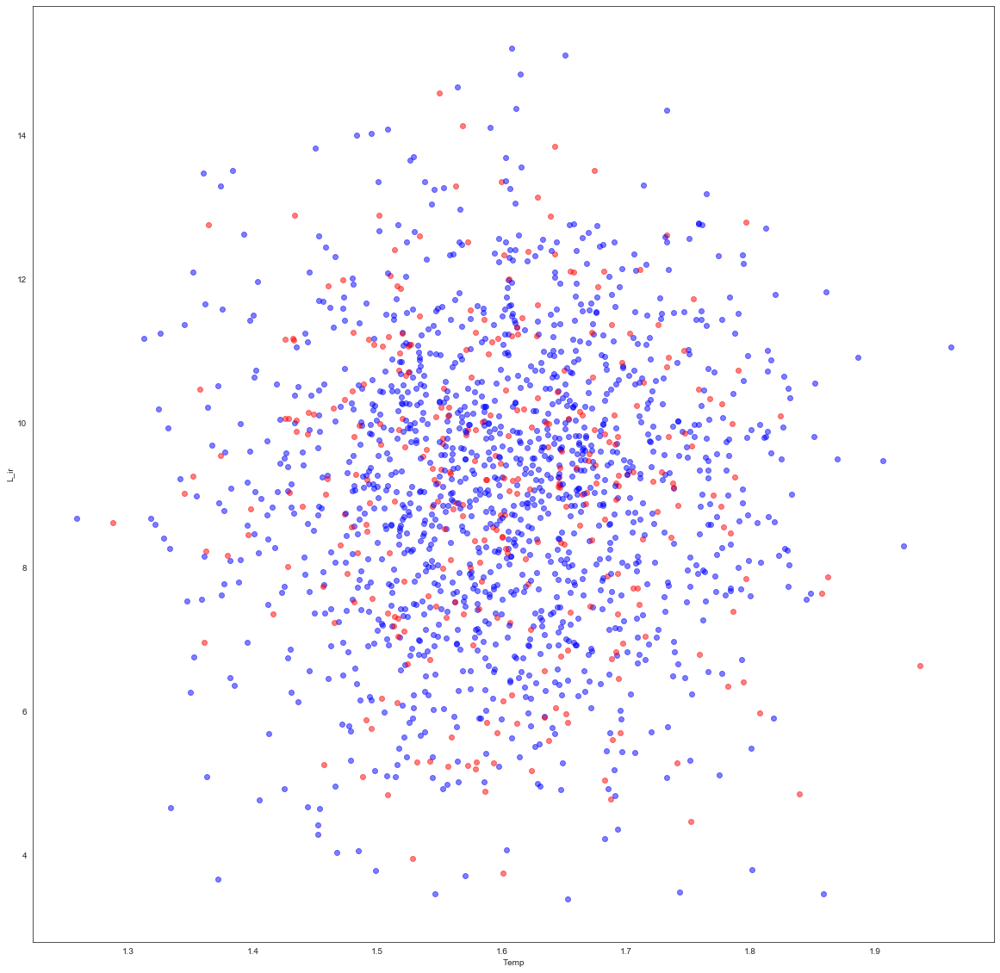

In [205]:
plt.figure(figsize=(20,20))
names=[i.split('_mu')[0] for i in phys_prior.prior_table.colnames[0:3]]
for s in range(0,num_samp):
    if posteriors[s].divergences.sum()>0:
        color='red'
    else:
        color='blue'
    plt.plot(phys_samp_prior_pred[s,:,2],phys_samp_prior_pred[s,:,0],'o',color=color,alpha=0.5)
plt.xlabel(names[2])
plt.ylabel(names[0])


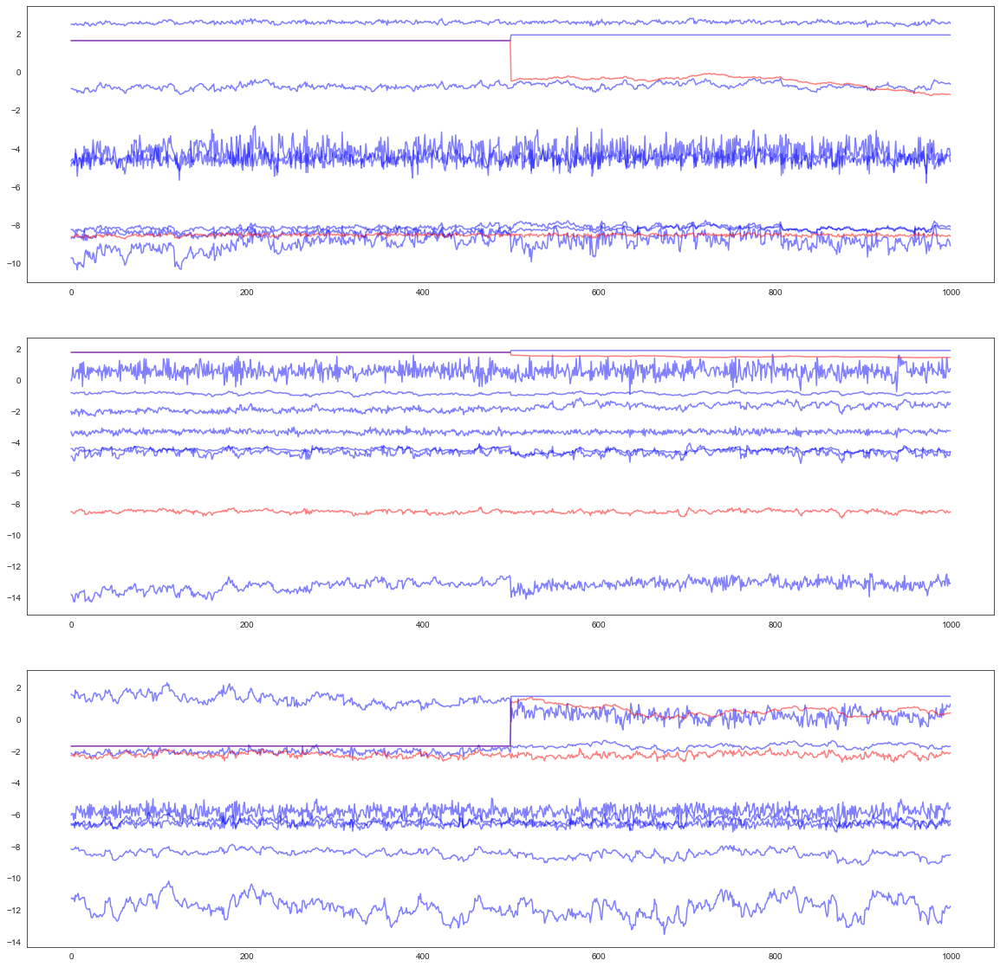

In [206]:
fig,axes=plt.subplots(3,1,figsize=(20,20))
for i in range(0,num_samp):
    if posteriors[i].divergences.sum()>0:
        color='red'
    else:
        color='blue'
    for b in range(0,3):
        axes[b].plot(posteriors[i].samples['bkg'][:,b],color=color,alpha=0.5)

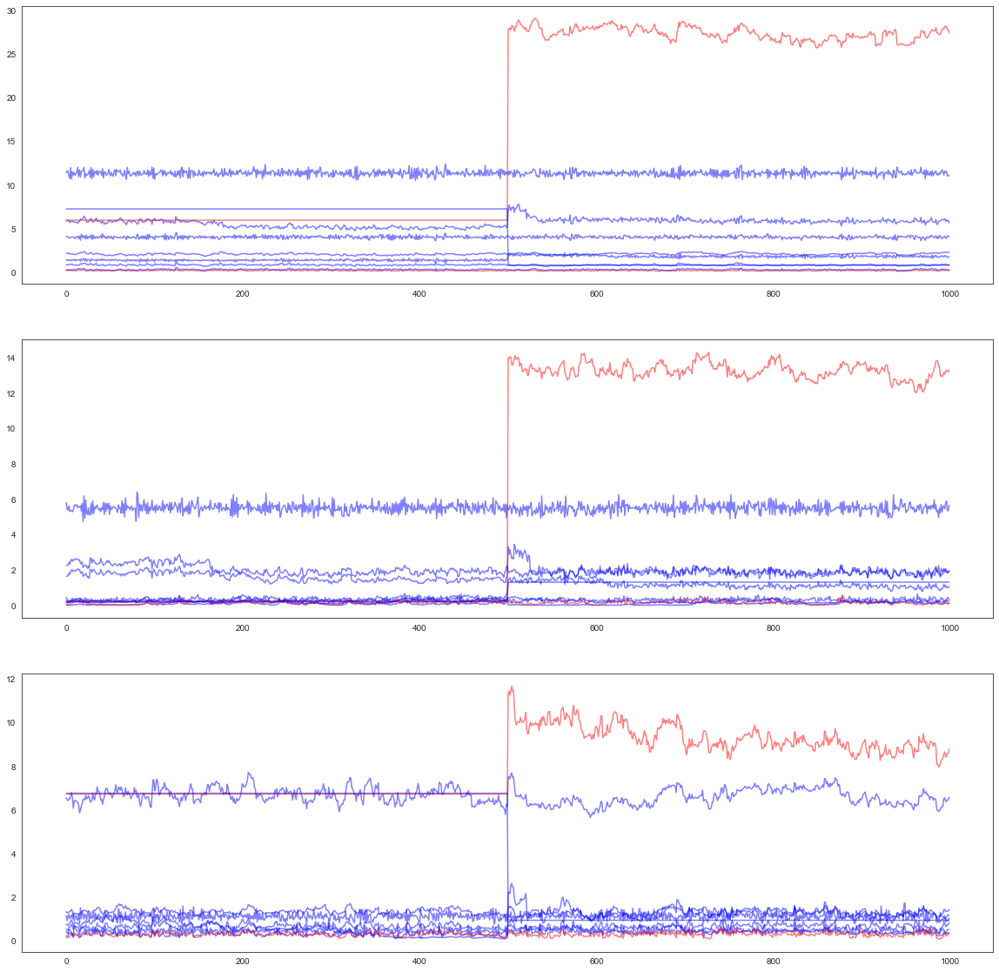

In [207]:
fig,axes=plt.subplots(3,1,figsize=(20,20))
for i in range(0,num_samp):
    if posteriors[i].divergences.sum()>0:
        color='red'
    else:
        color='blue'
    for b in range(0,3):
        axes[b].plot(posteriors[i].samples['sigma_conf'][:,b],color=color,alpha=0.5)

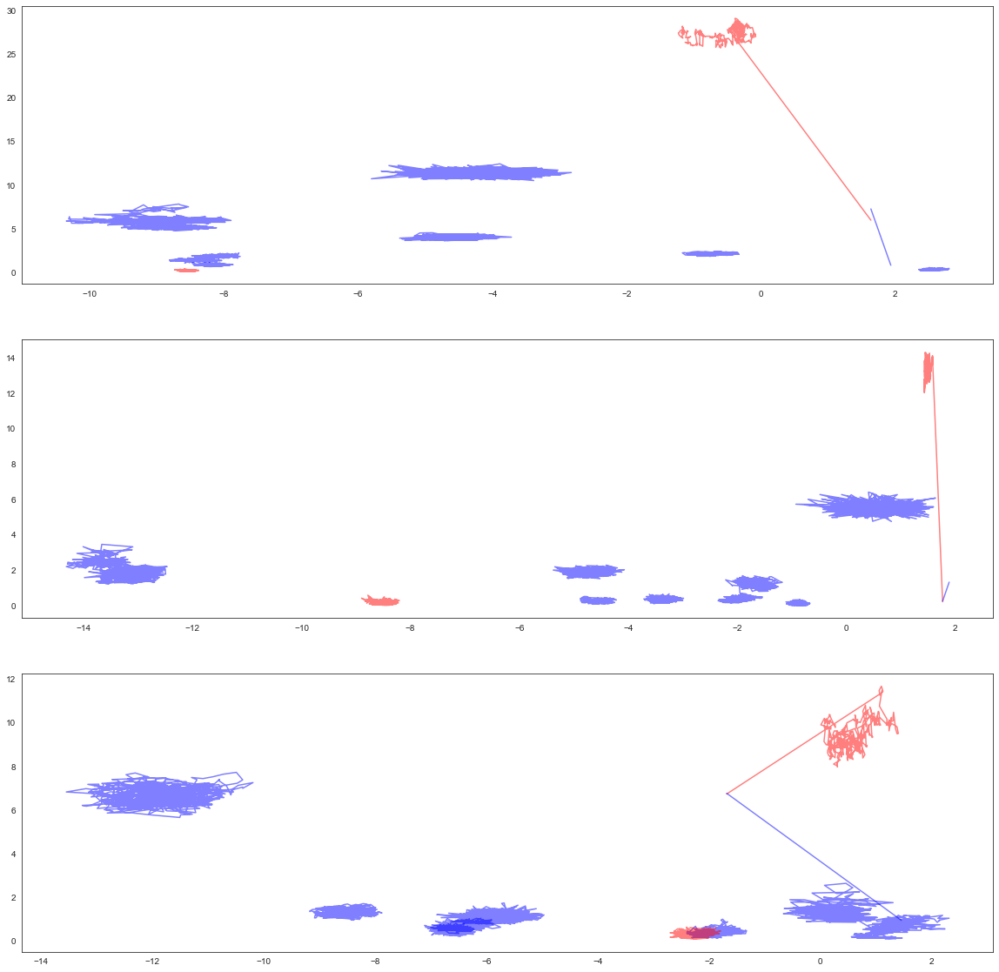

In [208]:
fig,axes=plt.subplots(3,1,figsize=(20,20))
for i in range(0,num_samp):
    if posteriors[i].divergences.sum()>0:
        color='red'
    else:
        color='blue'
    for b in range(0,3):
        axes[b].plot(posteriors[i].samples['bkg'][:,b],posteriors[i].samples['sigma_conf'][:,b],color=color,alpha=0.5)

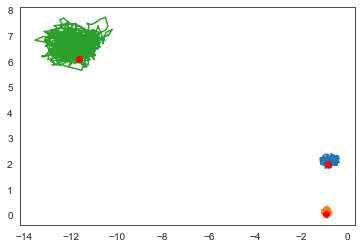

In [214]:
s=0
plt.plot(posteriors[s].samples['bkg'],posteriors[s].samples['sigma_conf'])
plt.plot(prior_pred['bkg'][s,:],prior_pred['sigma_conf'][s,:],'ro')

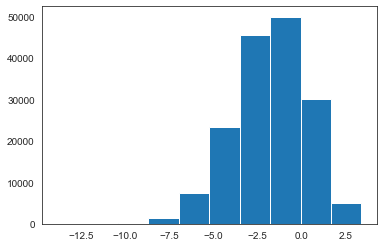

In [215]:
plt.hist(np.log10(posteriors[s].samples['src_f'][:,0,:].flatten()));

In [216]:
src_f=np.exp(phys_prior.emulator['net_apply'](phys_prior.emulator['params'],phys_prior.params_mu+prior_pred['params']*phys_prior.params_sig))

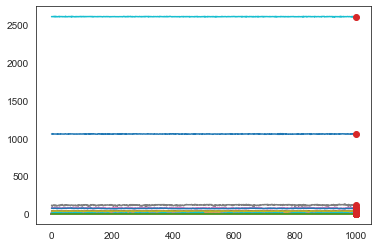

In [217]:
plt.plot(posteriors[s].samples['src_f'][:,0,:]);
plt.plot(np.full((163),1000),src_f[s,:,0],'o')

In [155]:
np.argmax(src_f[s,:,0])

151

very large fluxes seem to cause problems. Compare fluxes vs LIR and redshift? Maybe smarter priors on LIR are needed?

Text(0.5, 0, 'log10z')

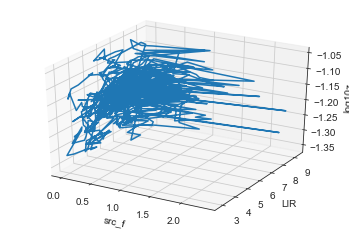

In [218]:
from mpl_toolkits import mplot3d
fig = plt.figure()
o=151
ax = plt.axes(projection='3d')
trans_params=phys_prior.emulator['inverse_transform_parameters'](posteriors[s].samples['params'])
ax.plot3D(posteriors[s].samples['src_f'][:,0,o],trans_params[:,o,0],trans_params[:,o,1]);
ax.set_xlabel('src_f')
ax.set_ylabel('LIR')
ax.set_zlabel('log10z')

In [144]:
phys_samp_prior_pred[s,o,:]

DeviceArray([10.742299  , -0.32464266,  1.553568  ], dtype=float32)

In [145]:
trans_params.shape

(1000, 163, 3)

In [219]:
from xidplus.numpyro_fit import SED_prior
fit_numpyro=SED_prior.all_bands(priors[0:3],phys_prior)
posterior=xidplus.posterior_numpyro_sed(fit_numpyro,priors[0:3],phys_prior)
xidplus.save(priors[0:3],posterior,'prior_XID+SED_ESB_32_added_source_flag_gaia_20210215')

Number of divergences: 11


In [220]:
phys_samp=phys_prior.emulator['inverse_transform_parameters'](posterior.samples['params'])


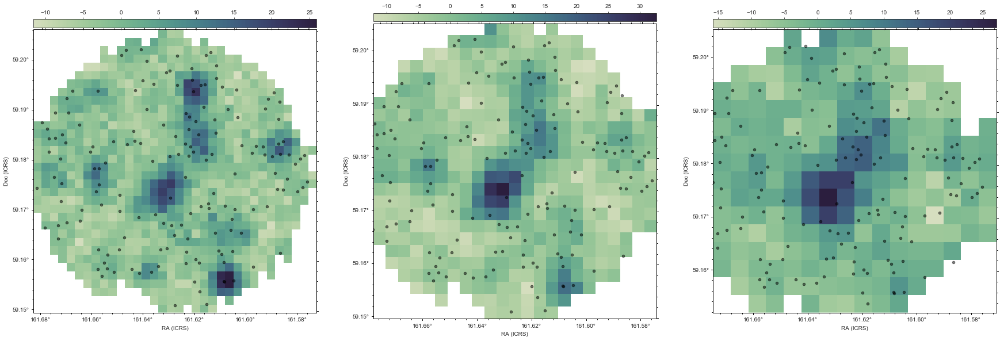

In [221]:
figs,fig=xidplus.plot_map(priors[0:3])

In [223]:
from numpyro.infer import Predictive
from jax import random, vmap


rng_key = random.PRNGKey(0)
rng_key, rng_key_ = random.split(rng_key)
import copy
priors_prior_pred_samp_p=copy.deepcopy(priors[0:3])
#set data to sample data
for i in range(0,3):
    priors_prior_pred_samp_p[i].sim=None
#sample from the prior using numpyro's Predictive function
prior_predictive_p=Predictive(SED_prior.spire_model,posterior_samples = fit_numpyro.get_samples(), num_samples = 50,)
prior_pred_p=prior_predictive_p(random.PRNGKey(0),priors_prior_pred_samp_p,phys_prior)
#Create a list of the model map arrays
mod_map_array_p=[prior_pred_p['obs_psw'].T,prior_pred_p['obs_pmw'].T,prior_pred_p['obs_plw'].T]
#feed the model map arrays the animation function
xidplus.plots.make_map_animation(priors[0:3],mod_map_array_p,50)

In [235]:
xidplus.plots.replicated_map_movie(priors,posterior,50)

In [81]:
#diverged
mod_map_diverge=[]
for i in range(0,3):
    mod_map_diverge.append(mod_map_array_p[i][:,posterior.divergences])
xidplus.plots.make_map_animation(priors[0:3],mod_map_diverge,50)

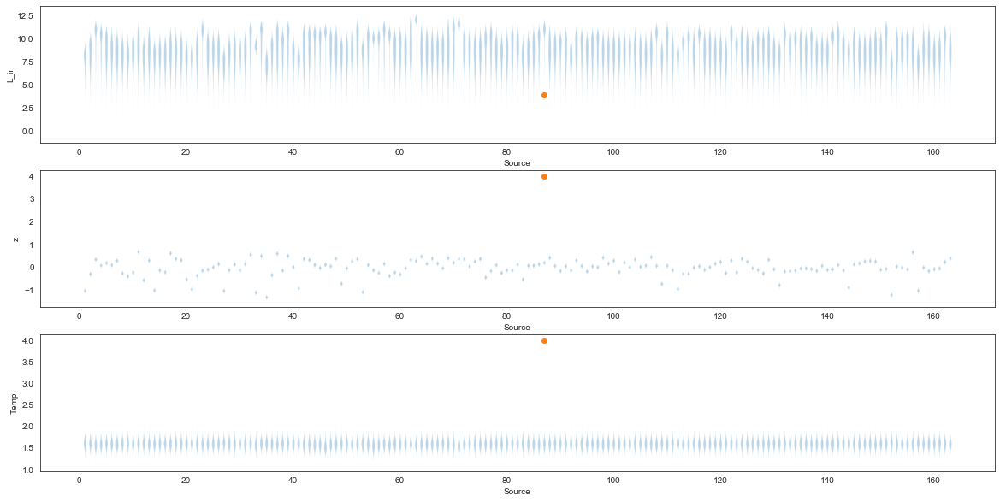

In [228]:
fig,axes=plt.subplots(3,1,figsize=(20,10))
names=[i.split('_mu')[0] for i in phys_prior.prior_table.colnames[0:3]]
for i in range(0,3):
    axes[i].violinplot(phys_samp[...,i].T,showextrema=False);
    axes[i].set_ylabel(names[i])
    axes[i].set_xlabel('Source')
    axes[i].plot(np.arange(1,priors[0].nsrc+1)[ind],4,'o')

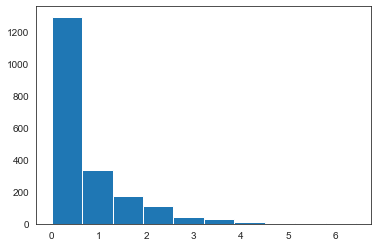

In [77]:
plt.hist(posterior.samples['src_f'][:,0,ind].flatten());

In [227]:
ind=priors[0].ID=='HELP_J104631.082+591021.253'

In [69]:
ind

masked_array(data=[False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False,  True, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False, False, False, False, False, False, False, False,
                   False,

Text(0, 0.5, 'z')

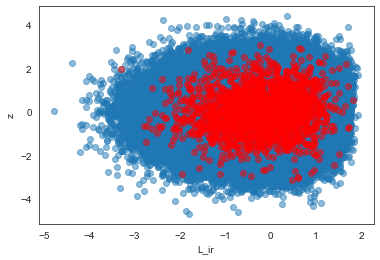

In [229]:
names=[i.split('_mu')[0] for i in phys_prior.prior_table.colnames[0:3]]

non_transformed_params=fit_numpyro.get_samples()['params']
plt.plot(non_transformed_params[:,:,0].flatten(),non_transformed_params[:,:,1].flatten(),'o',alpha=0.5)
plt.plot(non_transformed_params[posterior.divergences,:,0].flatten(),non_transformed_params[posterior.divergences,:,1].flatten(),'ro',alpha=0.5)
plt.xlabel(names[0])
plt.ylabel(names[1])

Text(0, 0.5, 'Temp')

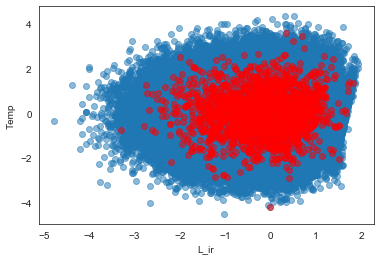

In [230]:
plt.plot(non_transformed_params[:,:,0].flatten(),non_transformed_params[:,:,2].flatten(),'o',alpha=0.5)
plt.plot(non_transformed_params[posterior.divergences,:,0].flatten(),non_transformed_params[posterior.divergences,:,2].flatten(),'ro',alpha=0.5)
plt.xlabel(names[0])
plt.ylabel(names[2])

Text(0, 0.5, 'Temp')

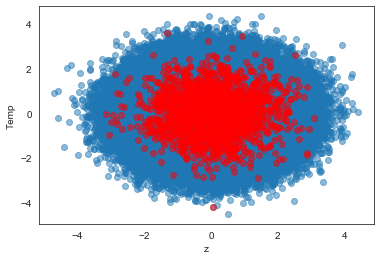

In [231]:
plt.plot(non_transformed_params[:,:,1].flatten(),non_transformed_params[:,:,2].flatten(),'o',alpha=0.5)
plt.plot(non_transformed_params[posterior.divergences,:,1].flatten(),non_transformed_params[posterior.divergences,:,2].flatten(),'ro',alpha=0.5)
plt.xlabel(names[1])
plt.ylabel(names[2])

(array([6.0000e+00, 2.1700e+02, 2.8220e+03, 1.8138e+04, 5.5320e+04,
        8.6486e+04, 6.4693e+04, 1.5531e+04, 2.5530e+03, 2.3400e+02]),
 array([-3.1283345 , -2.7164989 , -2.3046632 , -1.8928276 , -1.4809921 ,
        -1.0691564 , -0.6573208 , -0.2454852 ,  0.16635041,  0.57818604,
         0.99002165], dtype=float32),
 <a list of 10 Patch objects>)

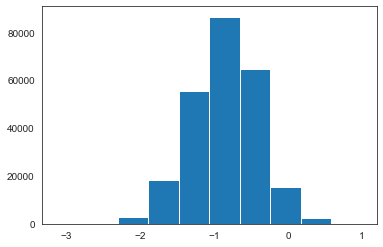

In [40]:
plt.hist(non_transformed_params[:,:,0].flatten())

(array([1.64890e+04, 1.12156e+05, 6.44580e+04, 3.92680e+04, 1.00230e+04,
        3.13100e+03, 4.15000e+02, 4.90000e+01, 8.00000e+00, 3.00000e+00]),
 array([-2.0894804 , -1.5292635 , -0.9690466 , -0.4088297 ,  0.15138721,
         0.7116041 ,  1.271821  ,  1.8320379 ,  2.3922548 ,  2.9524717 ,
         3.5126886 ], dtype=float32),
 <a list of 10 Patch objects>)

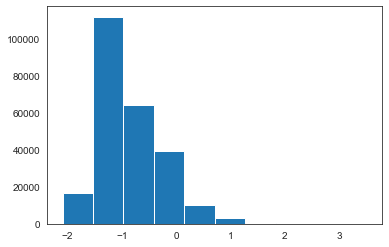

In [41]:
plt.hist(non_transformed_params[:,:,1].flatten())

(array([5.3000e+01, 8.9500e+02, 9.8150e+03, 4.5301e+04, 8.7364e+04,
        7.2747e+04, 2.5679e+04, 3.8910e+03, 2.5100e+02, 4.0000e+00]),
 array([-2.5791354 , -2.030994  , -1.4828527 , -0.9347113 , -0.3865699 ,
         0.1615715 ,  0.70971286,  1.2578542 ,  1.8059957 ,  2.354137  ,
         2.9022784 ], dtype=float32),
 <a list of 10 Patch objects>)

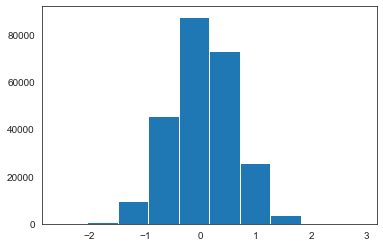

In [42]:
plt.hist(non_transformed_params[:,:,2].flatten())

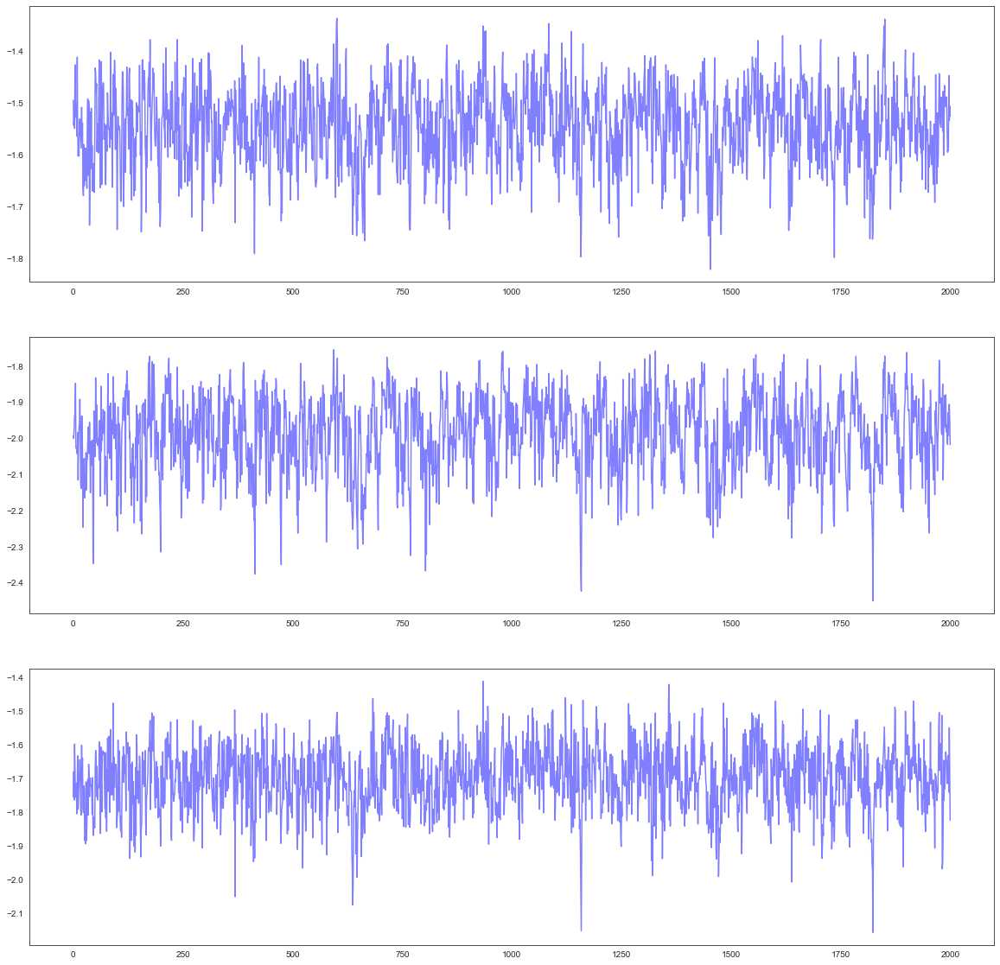

In [232]:
fig,axes=plt.subplots(3,1,figsize=(20,20))

for b in range(0,3):
    axes[b].plot(posterior.samples['bkg'][:,b],color=color,alpha=0.5)

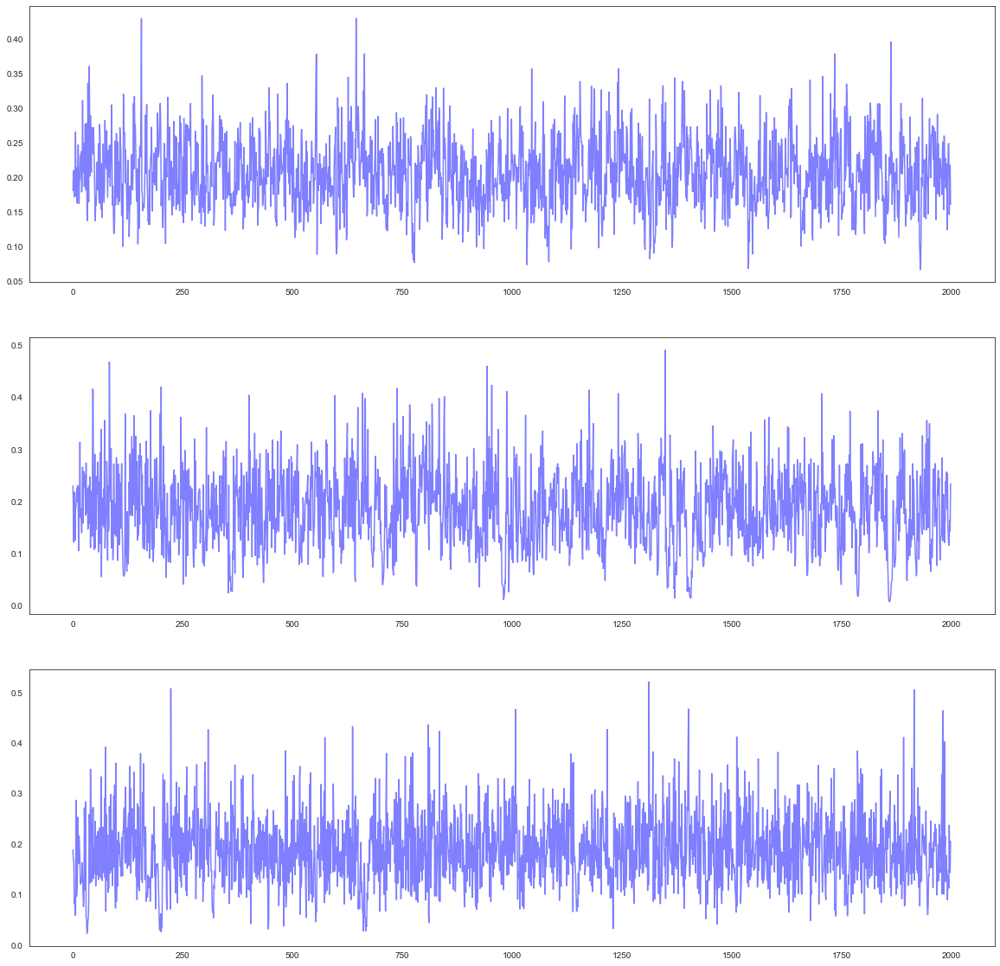

In [233]:
fig,axes=plt.subplots(3,1,figsize=(20,20))

for b in range(0,3):
    axes[b].plot(posterior.samples['sigma_conf'][:,b],color=color,alpha=0.5)

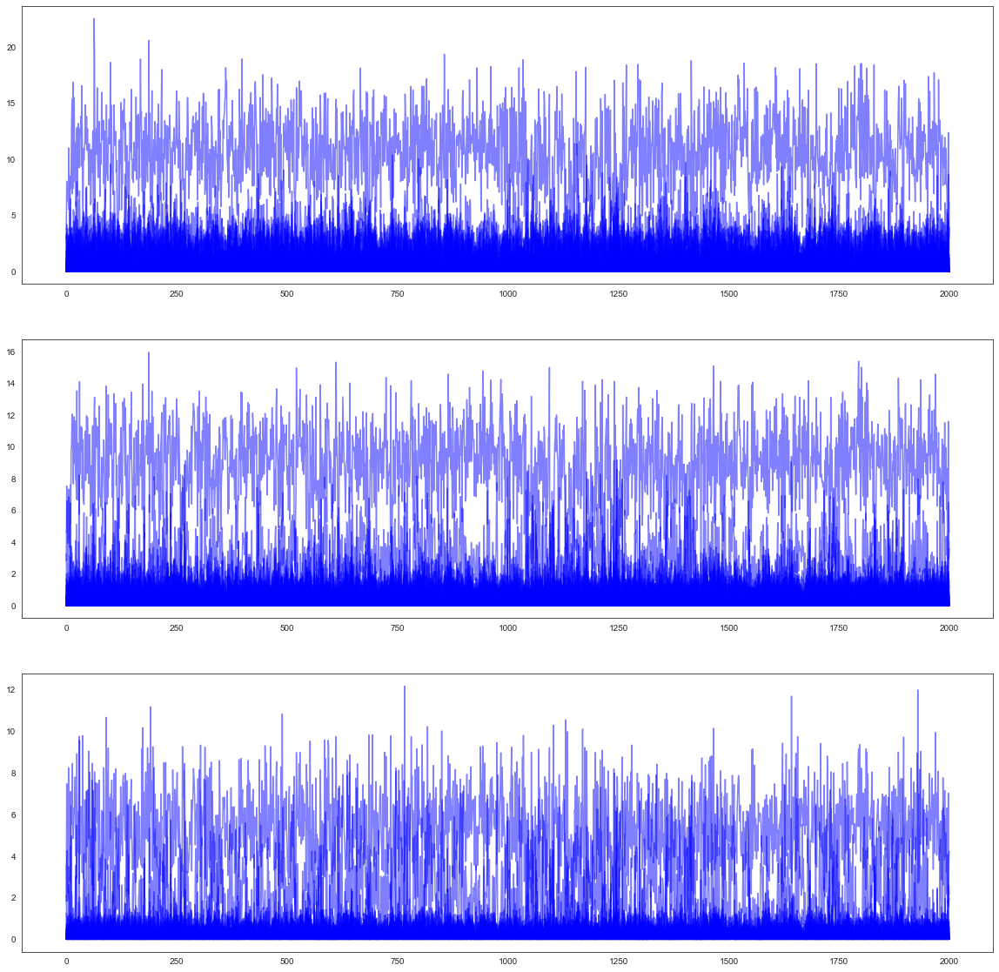

In [237]:
fig,axes=plt.subplots(3,1,figsize=(20,20))

for b in range(0,3):
    axes[b].plot(posterior.samples['src_f'][:,b,:],color=color,alpha=0.5)

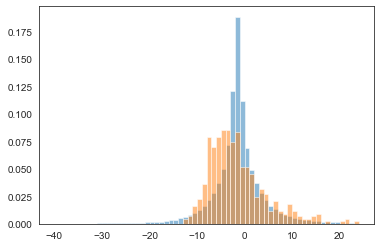

In [273]:
plt.hist(mod_map_array_p[1][:,:].flatten(),bins=np.arange(-40,25),alpha=0.5,normed=True);
plt.hist(priors[1].sim,bins=np.arange(-40,25),alpha=0.5,normed=True);

([<aplpy.core.FITSFigure at 0x7f92df6c4ac8>,
 <Figure size 2160x720 with 6 Axes>)

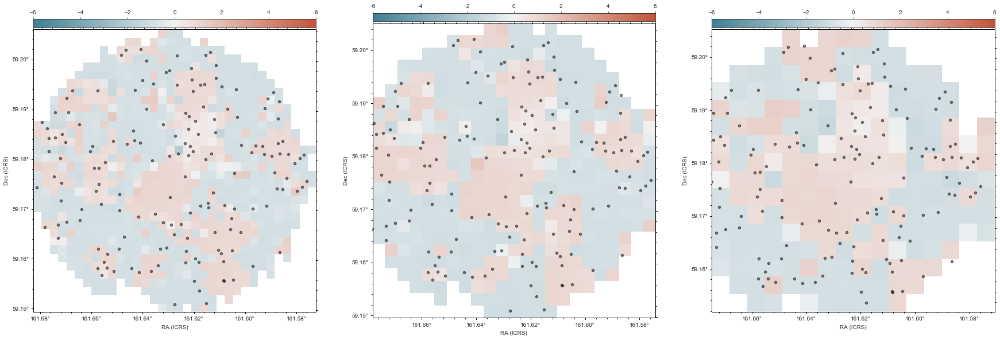

In [256]:
xidplus.plots.plot_Bayes_pval_map(priors,posterior)

where are all the negative pixels coming from?

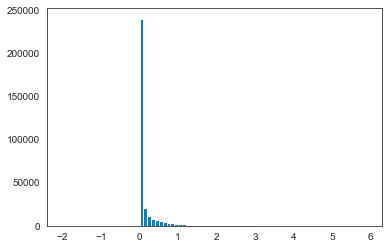

In [283]:
plt.hist(posterior.samples['src_f'][:,0,:].flatten(),bins=np.arange(-2,6,0.1));

if the majority of the sources are zero, it means the background has to be higher, which in turn meanssources that do have higher flux cannot become higher because the background is so high. How do I test?
* Set every source to mean prior LIR and z. What flux do I get?
* Is normal too restrictive? Does it need to be wider? Problem with wider is it could give too low flux for emulator? * Could set too higher? The fluxes would be forced lower by data.
* Fit mu and sigma for LIR? Extreme but cool...

#### Set Every Source to prior LIR and z, get flux

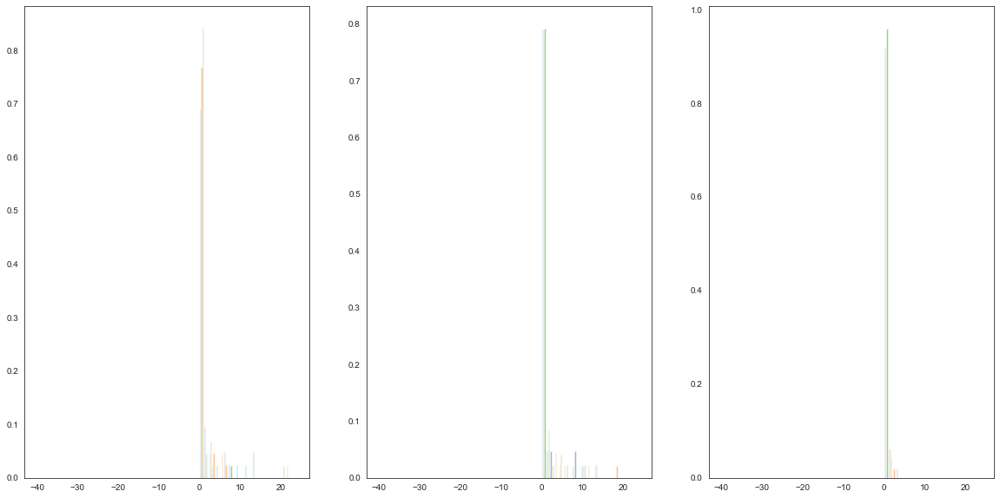

In [289]:
fig,axes=plt.subplots(1,3,figsize=(20,10))
src_f_mu=np.exp(phys_prior.emulator['net_apply'](phys_prior.emulator['params'],phys_prior.params_mu)).shape
for b in range(0,3):
    axes[b].hist(src_f[:,b],alpha=0.5,bins=np.arange(-40,25),normed=True)


In [259]:
posterior.samples['src_f'].shape

(2000, 3, 163)

In [267]:
xidplus.replicated_map_movie(priors,posteriors[0],50)

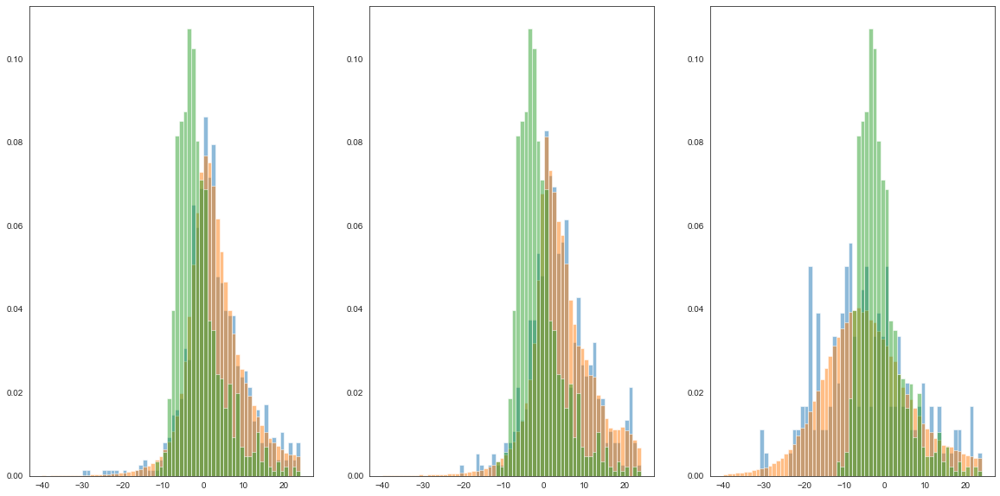

In [272]:
fig,axes=plt.subplots(1,3,figsize=(20,10))
mod_map_temp=xidplus.postmaps.replicated_maps(priors,posteriors[0])
for b in range(0,3):
    axes[b].hist(mod_map_array[b][:,0],alpha=0.5,bins=np.arange(-40,25),normed=True)
    axes[b].hist(mod_map_temp[b][:,:].flatten(),alpha=0.5,bins=np.arange(-40,25),normed=True)
    axes[b].hist(priors[0].sim,bins=np.arange(-40,25),alpha=0.5,normed=True);